In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os

import tensorflow.keras as keras
from tensorflow.data import AUTOTUNE



if os.getcwd().startswith("/Users"): os.chdir(os.getcwd().replace("/notebooks", ""))

from src.config.notebook_config import NotebookConfig

from src.data.dataset import dataset_v3_loader as dataset_loader
from src.evaluation.evaluation import Evaluation

from src.data.utility.tf_dataset_transformer import TfDatasetTransformer

%load_ext autoreload
%autoreload 2

# Config

In [5]:
config = NotebookConfig("model_5", "v3")

DATASET_LOADER = dataset_loader
BATCH_SIZE = 128

# Data

In [6]:
val_dataset = DATASET_LOADER.load_validation_v3()

tf_dataset_transformer =  TfDatasetTransformer(image_shape=config.image_shape)

val_tf_dataset = tf_dataset_transformer.transform_to_tf_dataset(val_dataset)\
                                         .cache("./tf_cache/val_dataset")\
                                         .batch(128)\
                                         .prefetch(AUTOTUNE)

# Evaluation

In [7]:
model: keras.Model = keras.models.load_model(config.saved_model_path)
print(f"Loaded model from {config.saved_model_path}")

Loaded model from ./models/tensorflow/model_5_v3


In [8]:
evaluation = Evaluation(dataset=val_dataset, image_shape=config.image_shape, model=model)

In [10]:
evaluation.print_f1_report(threshold=0.5)
evaluation.print_separate_f1_reports(threshold=0.5)

461/461 [==============================] - 872s 2s/step
              precision    recall  f1-score   support

       False       0.99      0.97      0.98     13405
        True       0.97      0.99      0.98     16086

    accuracy                           0.98     29491
   macro avg       0.98      0.98      0.98     29491
weighted avg       0.98      0.98      0.98     29491

Regular pairs:
              precision    recall  f1-score   support

       False       1.00      0.97      0.98     13405
        True       0.86      1.00      0.93      2681

    accuracy                           0.97     16086
   macro avg       0.93      0.98      0.96     16086
weighted avg       0.98      0.97      0.97     16086

Augmented pairs:
              precision    recall  f1-score   support

       False       0.00      0.00      0.00         0
        True       1.00      0.99      0.99     13405

    accuracy                           0.99     13405
   macro avg       0.50      0.49      0

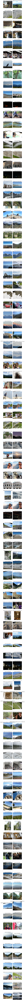

In [11]:
evaluation.show_images(range(8000, 8100))